In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale,maxabs_scale
import seaborn as sns
from scipy.spatial.transform import Rotation



## initialize required quaterneon calculation routines 

In [2]:
def quaternion_inverse(q):
  """Calculate the inverse of a quaternion.

  Args:
    q: A quaternion represented as a 4-element numpy array.

  Returns:
    The inverse of the quaternion, represented as a 4-element numpy array.
  """

  q_conj = np.conj(q)
  q_norm = np.linalg.norm(q)
  return q_conj / (q_norm * q_norm)

In [3]:
def quaternion_multiply(q1, q2):
  """Multiply two quaternions.

  Args:
    q1: A quaternion represented as a 4-element numpy array.
    q2: A quaternion represented as a 4-element numpy array.

  Returns:
    The product of the two quaternions, represented as a 4-
    element numpy array.
    
    """
  w1, x1, y1, z1 = q1
  w2, x2, y2, z2 = q2
  w = w1 * w2 - x1 * x2 - y1 * y2 - z1 * z2
  x = w1 * x2 + x1 * w2 + y1 * z2 - z1 * y2
  y = w1 * y2 - x1 * z2 + y1 * w2 + z1 * x2
  z = w1 * z2 + x1 * y2 - y1 * x2 + z1 * w2
  return w, x, y, z


In [4]:
def vec_length(v: np.array):
    return np.sqrt(sum(i**2 for i in v))

def normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
       return v
    return v / norm

def orientation(rs: np.array, ls: np.array):
    axis_z = normalize((rs - ls))
    if vec_length(axis_z) == 0:
        axis_z = np.array((0, -1, 0))
        
    axis_x = np.cross(np.array((0, 0, 1)), axis_z)
    if vec_length(axis_x) == 0:
        axis_x = np.array((1, 0, 0))
    
    axis_y = np.cross(axis_z, axis_x)
    rot_matrix = np.matrix([axis_x, axis_y, axis_z]).transpose()
    #quat=Rotation.from_matrix(rot_matrix).as_quat()
    return Rotation.from_matrix(rot_matrix).as_quat()
def to_quat(df: pd.DataFrame):
    return df.apply(lambda x: orientation(np.array([x[0],x[1],x[2]]),np.array([x[3],x[4],x[5]])),axis=1).to_list()
def get_distance(df:list):
    dfr=[]
    for i in range(0,len(df)-1,2):
        xi = quaternion_inverse(df[i])
        xy = quaternion_multiply(xi,df[i+1])
        dfr.append(2*np.arccos(xy[0])*180/np.pi)
        #dfr.append(np.arccos(xy[0]))
    return dfr

## Walk thru  all directories in the dataset and combine data to one Pandas Dataframe . apply euclidenan distance and angle 

In [21]:
X= pd.DataFrame()
y=[]
for root, dirs, files in os.walk('../Data/MediaPipe/Train'):
        for name in files:
                if(name.endswith('.csv') == False):
                    continue
                filepath = root + os.sep + name
                worktype = filepath.split(os.sep )[-2]
                filename = filepath.split(os.sep)[-1].replace('.csv','')
                if(os.path.getsize(filepath) > 0):
                    df = pd.read_csv(filepath,index_col=0)
                    df1 = pd.DataFrame()
                    df1['shoulder'] = get_distance(to_quat(pd.concat([df['11'],df['11.1'],df['11.2'],df['23'],df['23.1'],df['23.2']],axis=1)))
                    df1['hip'] = get_distance(to_quat(pd.concat([df['23'],df['23.1'],df['23.2'],df['24'],df['24.1'],df['24.2']],axis=1)))
                    df1['lhand1'] = get_distance(to_quat(pd.concat([df['11'],df['11.1'],df['11.2'],df['13'],df['13.1'],df['13.2']],axis=1)))
                    df1['rhand1'] = get_distance(to_quat(pd.concat([df['12'],df['12.1'],df['12.2'],df['14'],df['14.1'],df['14.2']],axis=1)))
                    df1['lhand2'] = get_distance(to_quat(pd.concat([df['13'],df['13.1'],df['13.2'],df['15'],df['15.1'],df['15.2']],axis=1)))
                    df1['rhand2'] = get_distance(to_quat(pd.concat([df['14'],df['14.1'],df['14.2'],df['16'],df['16.1'],df['16.2']],axis=1)))
                    df1['lleg1'] = get_distance(to_quat(pd.concat([df['23'],df['23.1'],df['23.2'],df['25'],df['25.1'],df['25.2']],axis=1)))
                    df1['rleg1'] = get_distance(to_quat(pd.concat([df['24'],df['24.1'],df['24.2'],df['26'],df['26.1'],df['26.2']],axis=1)))
                    df1['lleg2'] = get_distance(to_quat(pd.concat([df['25'],df['25.1'],df['25.2'],df['27'],df['27.1'],df['27.2']],axis=1)))
                    df1['rleg2'] = get_distance(to_quat(pd.concat([df['26'],df['26.1'],df['26.2'],df['28'],df['28.1'],df['28.2']],axis=1)))
                    df1['filename'] = filename
                    df1['workout'] = worktype
                    X = pd.concat([X,df1],axis=0)
                    y.append(worktype)


In [22]:
#Check for duplicates
duplicate_count = X.duplicated().sum()
duplicate_count

0

## Missing values 
Next create a pandas dataframe to hold the missing value summary 

In [23]:
X.isnull().sum()
na_cols=X.columns[X.isna().any()].tolist()
 # Missing values summary
mv=pd.DataFrame(X[na_cols].isna().sum(), columns=['Number_missing'])
desc = pd.DataFrame(index = list(X))
desc['count'] = X.count()
desc['nunique'] = X.nunique()
desc['%unique'] = desc['nunique'] / len(X) * 100
desc['null'] = X.isnull().sum()
desc['Percentage_missing']=np.round(100*mv['Number_missing']/len(X),2)
desc['type'] = X.dtypes
desc = pd.concat([desc, X.describe().T.drop('count', axis = 1)], axis = 1)
desc

,count,nunique,%unique,null,Percentage_missing,type,mean,std,min,25%,50%,75%,max
shoulder,6930,6930,100.000000,0,NaN,float64,179.108748,71.180225,27.038983,140.455642,165.344097,222.006863,355.115607
hip,6930,6930,100.000000,0,NaN,float64,287.782854,43.960674,42.524281,258.017493,274.127460,333.593818,359.876420
lhand1,6930,6930,100.000000,0,NaN,float64,202.681220,50.364418,16.107449,165.971558,198.798723,234.637791,358.279788
rhand1,6930,6930,100.000000,0,NaN,float64,208.628971,43.379844,6.247461,182.441767,200.024780,236.082520,358.850033
lhand2,6930,6930,100.000000,0,NaN,float64,172.875732,64.395478,5.308399,130.905860,159.599585,197.382641,359.069310
rhand2,6930,6930,100.000000,0,NaN,float64,212.662466,57.479471,21.893410,171.517105,207.077010,244.157002,359.359293
lleg1,6930,6930,100.000000,0,NaN,float64,208.582301,66.836653,1.289917,173.387061,218.977960,245.084960,359.790531
rleg1,6930,6930,100.000000,0,NaN,float64,211.625484,72.880513,4.499667,167.348092,217.413633,252.007116,359.594890
lleg2,6930,6930,100.000000,0,NaN,float64,178.943438,77.778878,3.530434,124.819275,152.017534,225.060309,359.763039
rleg2,6930,6930,100.000000,0,NaN,float64,169.113967,74.583587,4.744912,127.420042,142.581258,206.567423,359.605441


## EDA Exploratary Data Analysis 


Check for correlation of numerical columns

In [24]:
X.select_dtypes('number').corr()

,shoulder,hip,lhand1,rhand1,lhand2,rhand2,lleg1,rleg1,lleg2,rleg2
shoulder,1.000000,0.254408,0.297010,0.421155,0.069696,-0.039857,0.266041,0.144917,0.251126,0.424490
hip,0.254408,1.000000,0.002262,0.109838,-0.136961,-0.181585,-0.001960,-0.044415,0.104956,0.183626
lhand1,0.297010,0.002262,1.000000,0.371959,0.509963,0.306517,0.306189,0.268599,0.090387,0.085995
rhand1,0.421155,0.109838,0.371959,1.000000,0.460326,0.453559,0.337149,0.283063,0.004134,0.182254
lhand2,0.069696,-0.136961,0.509963,0.460326,1.000000,0.684087,0.160731,0.134170,-0.228362,-0.196460
rhand2,-0.039857,-0.181585,0.306517,0.453559,0.684087,1.000000,0.157881,0.137727,-0.274141,-0.256534
lleg1,0.266041,-0.001960,0.306189,0.337149,0.160731,0.157881,1.000000,0.716606,0.069800,0.319053
rleg1,0.144917,-0.044415,0.268599,0.283063,0.134170,0.137727,0.716606,1.000000,0.230234,0.254808
lleg2,0.251126,0.104956,0.090387,0.004134,-0.228362,-0.274141,0.069800,0.230234,1.000000,0.663207
rleg2,0.424490,0.183626,0.085995,0.182254,-0.196460,-0.256534,0.319053,0.254808,0.663207,1.000000


Plot heatmap of correlation w.r.t numerical columns

<Axes: >

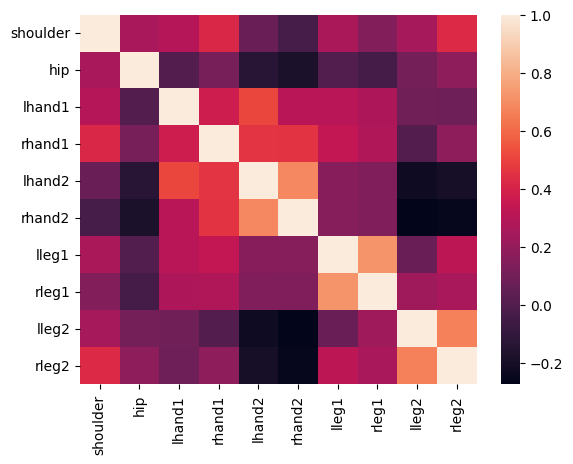

In [25]:
sns.heatmap(X.select_dtypes('number').corr())

# heatmap by workout

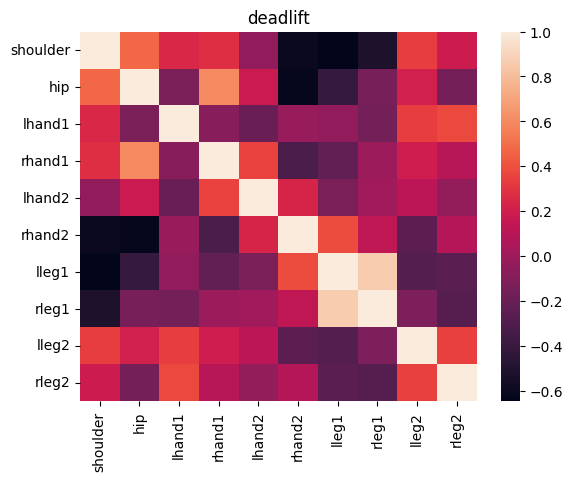

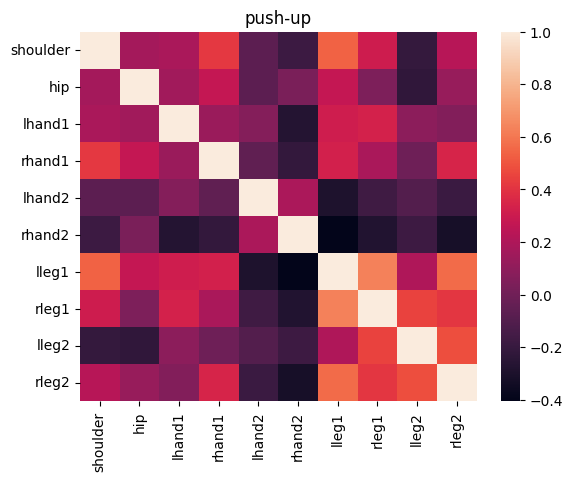

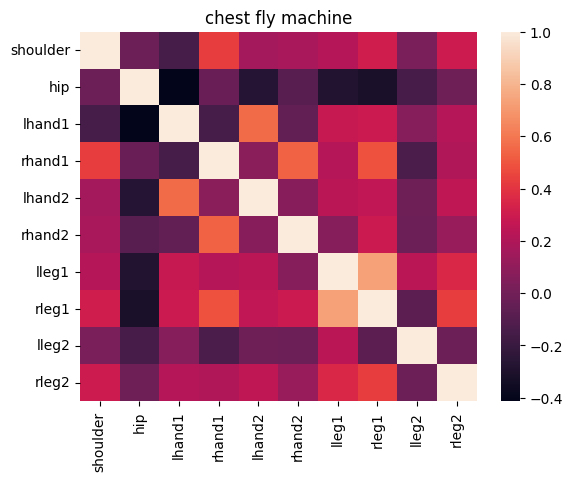

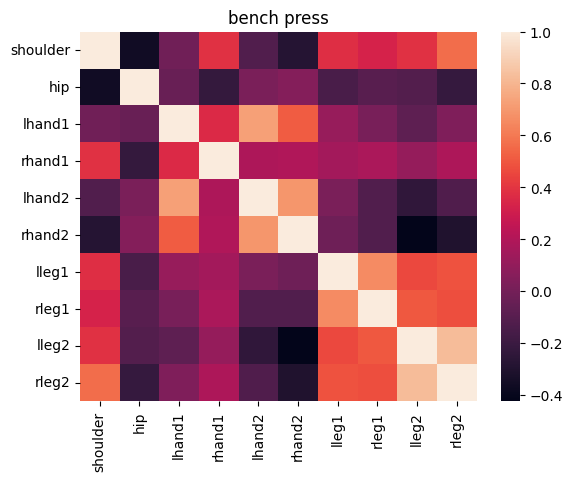

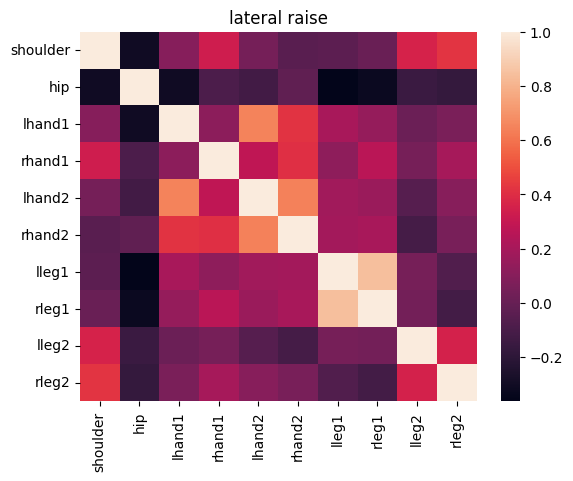

In [26]:
workouts = X['workout'].unique()
for work in workouts:
    X[X['workout'] == work].select_dtypes('number').corr()
    sns.heatmap(X[X['workout'] == work].select_dtypes('number').corr())
    plt.title(work)
    plt.show()

Look at the distribution of numerical features using distplot

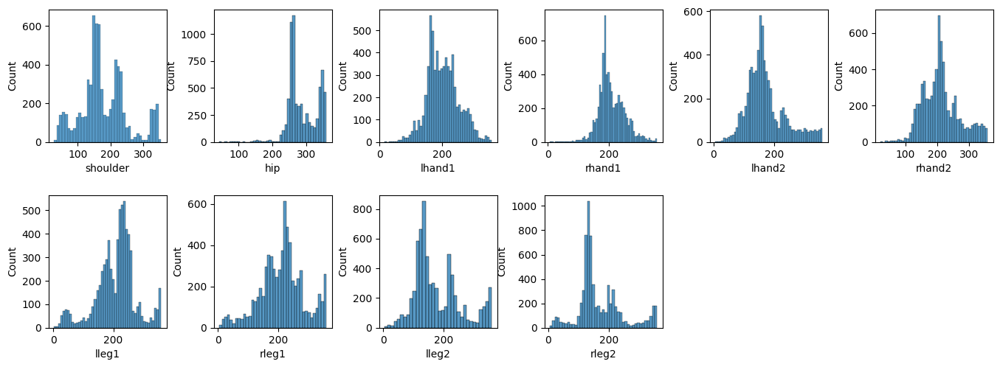

In [27]:
i=1
for x in X.select_dtypes('number').columns:
  
    plt.subplot(6,6,i)
    sns.histplot(X[x])
    plt.subplots_adjust(left=0.0,bottom=0.0,right=2.0,top=3.0,wspace=0.4,hspace=0.4)
    i = i+1


# Scatter plot of left joints

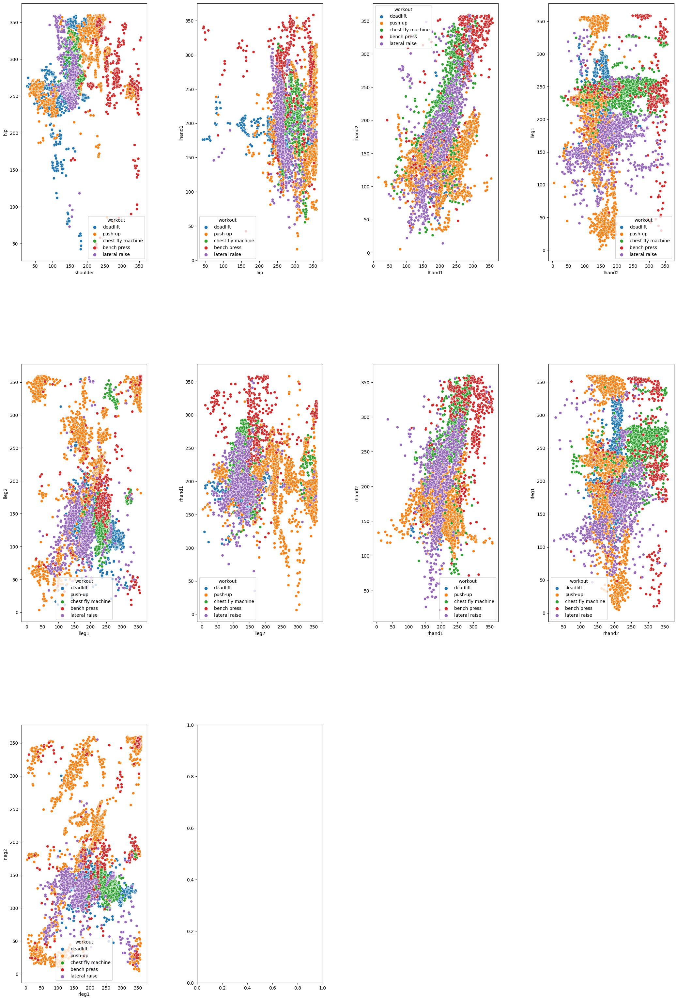

In [32]:
cols = ['shoulder','hip','lhand1','lhand2','lleg1','lleg2','rhand1','rhand2','rleg1','rleg2']
i=1
plt.figure(figsize=(10,10))
for idx,x in enumerate(cols):
    plt.subplot(3,4,i)
    if(idx == len(cols)-1):
        continue
    sns.scatterplot(x=X[x],y=X[cols[idx+1]],hue=X['workout'])
    plt.subplots_adjust(left=0.0,bottom=0.0,right=2.0,top=3.0,wspace=0.4,hspace=0.4)
    i = i+1


# Line plot of different joints within a workout 

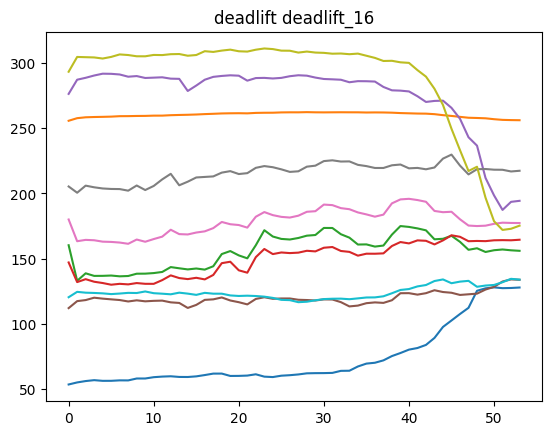

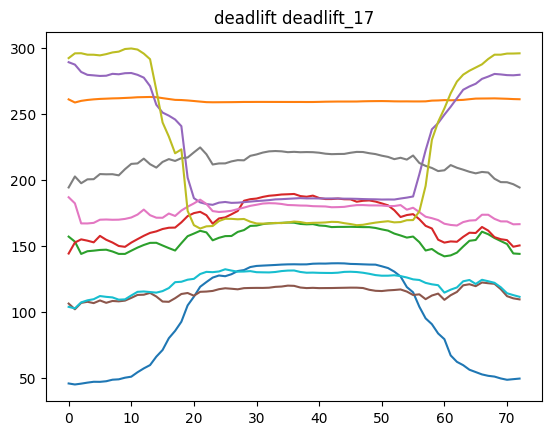

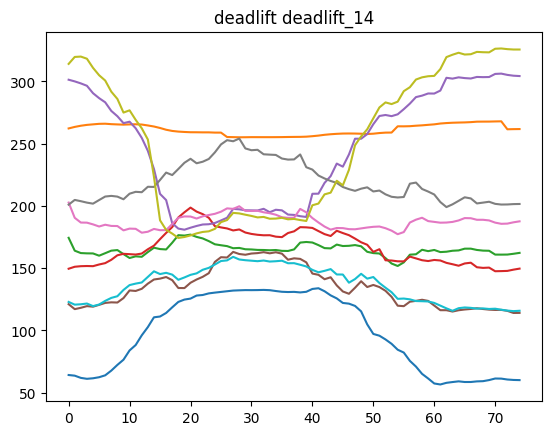

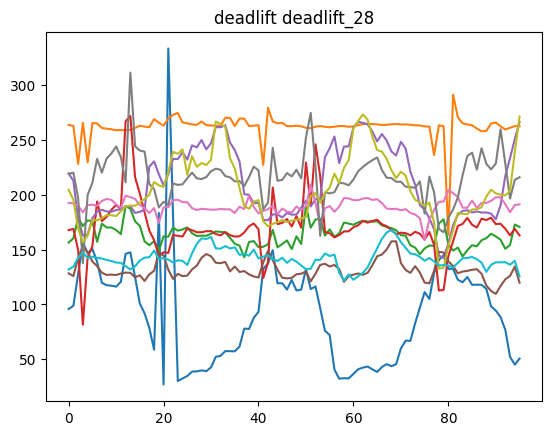

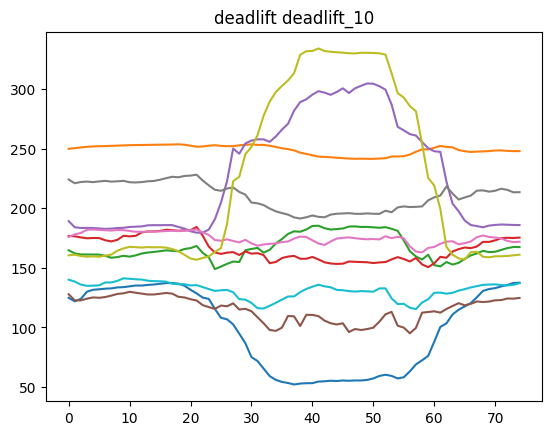

...

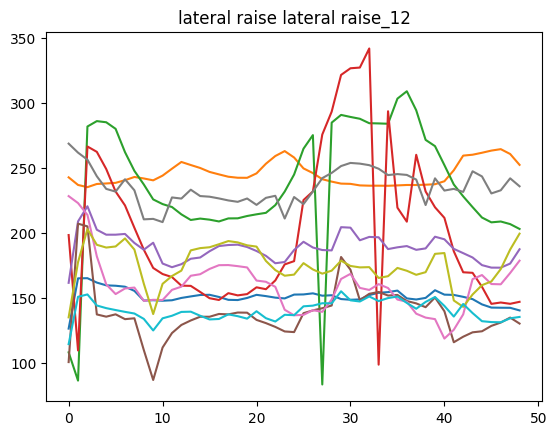

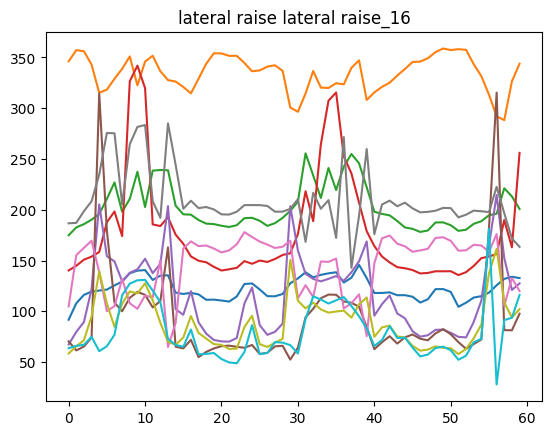

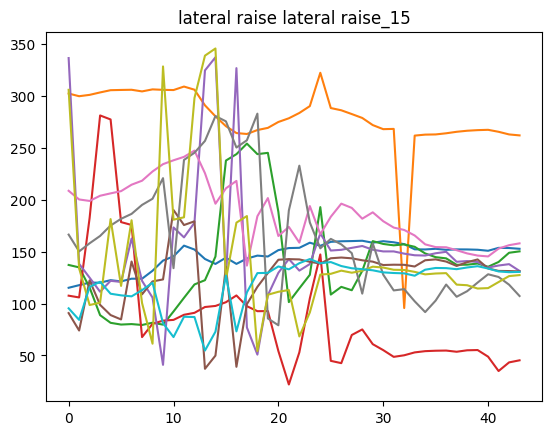

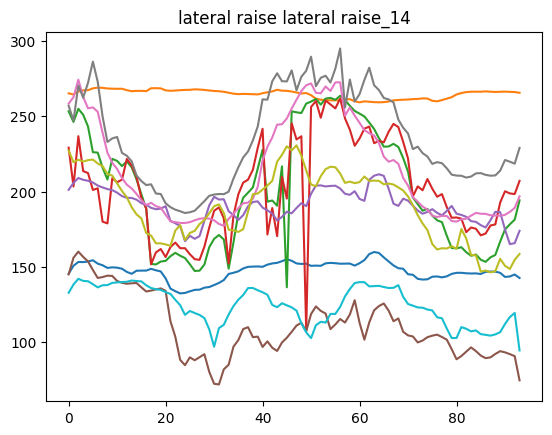

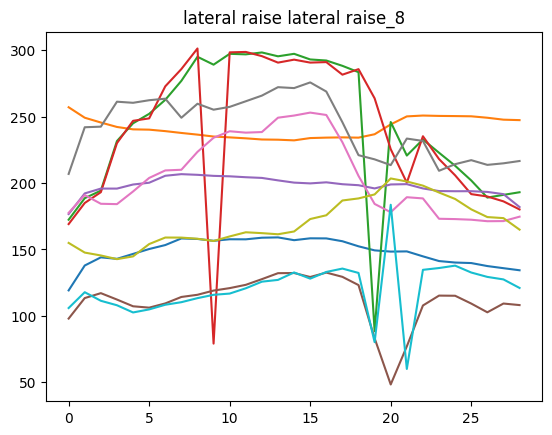

In [34]:
workouts = X['workout'].unique()
for work in workouts:
    filenames = X[X['workout'] == work]['filename'].unique()
    for file in filenames:
        plt.plot(X[(X['workout'] == work) & (X['filename'] == file)].select_dtypes('number')[cols])
        plt.title(work + ' ' + file)
        plt.show()